# Welcome to the HydraNet Workshop 🐸🐸🐸
In this workshop, you're going to learn how to build a Neural Network that has:
* Input: **a monocular RGB Image**
* Output: **a Depth Map**, and **a Segmentation Map**

A single model, two different outputs. For that, out model will need to use a principle called Multi Task Learning.<p>

# 1 - Imports

In [1]:
!wget https://hydranets-data.s3.eu-west-3.amazonaws.com/hydranets-data.zip && unzip -q hydranets-data.zip && mv hydranets-data/* . && rm hydranets-data.zip && rm -rf hydranets-data

--2022-12-19 22:39:30--  https://hydranets-data.s3.eu-west-3.amazonaws.com/hydranets-data.zip
Resolving hydranets-data.s3.eu-west-3.amazonaws.com (hydranets-data.s3.eu-west-3.amazonaws.com)... 52.95.154.72
Connecting to hydranets-data.s3.eu-west-3.amazonaws.com (hydranets-data.s3.eu-west-3.amazonaws.com)|52.95.154.72|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 110752264 (106M) [application/zip]
Saving to: ‘hydranets-data.zip’

hydranets-data.zip  100%[===================>] 105.62M  20.0MB/s    in 6.1s    

2022-12-19 22:39:37 (17.2 MB/s) - ‘hydranets-data.zip’ saved [110752264/110752264]



In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import cv2
import torch
import torch.nn as nn
import math
import torch.nn.functional as F
from torch.autograd import Variable

# 2 — Creating the HydraNet
We now have 2 DataLoaders: one for training, and one for validation/test. <p>

In the next step, we're going to define our model, following the paper [Real-Time Joint Semantic Segmentation and Depth Estimation Using Asymmetric Annotations](https://arxiv.org/pdf/1809.04766.pdf) —— If you haven't read it yet, now is the time.<p>

A Note — This notebook has been adapted from DrSleep, a researcher named Vladimir, who authorized me to adapt it for education purposes. [Here's the notebook I'm refering to](https://github.com/DrSleep/multi-task-refinenet/blob/master/src/notebooks/ExpNYUDKITTI_joint.ipynb/).

<p>

> ![](https://d3i71xaburhd42.cloudfront.net/435d4b5c30f10753d277848a17baddebd98d3c31/2-Figure1-1.png)

Our model takes an input RGB image, make it go through an encoder, a lightweight refinenet decoder, and then has 2 heads, one for each task.<p>
Things to note:
* The only **convolutions** we'll need will be 3x3 and 1x1
* We also need a **MaxPooling 5x5**
* **CRP-Blocks** are implemented as Skip-Connection Operations
* **Each Head is made of a 1x1 convolution followed by a 3x3 convolution**, only the data and the loss change there


## 2.1 — Create a HydraNet class

In [3]:
class HydraNet(nn.Module):
    def __init__(self):        
        super().__init__() # Python 3
        self.num_tasks = 2
        self.num_classes = 6

In [4]:
hydranet = HydraNet()

## 2.2 — Defining the Encoder: A MobileNetv2
![](https://iq.opengenus.org/content/images/2020/11/conv_mobilenet_v2.jpg)

In [5]:
def conv3x3(in_channels, out_channels, stride=1, dilation=1, groups=1, bias=False):
    """3x3 Convolution: Depthwise: 
    https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html
    """
    return nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=dilation, dilation=dilation, bias=bias, groups=groups)

In [6]:
def conv1x1(in_channels, out_channels, stride=1, groups=1, bias=False,):
    "1x1 Convolution: Pointwise"
    return nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, padding=0, bias=bias, groups=groups)

In [7]:
def batchnorm(num_features):
    """
    https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm2d.html
    """
    return nn.BatchNorm2d(num_features, affine=True, eps=1e-5, momentum=0.1)

In [8]:
def convbnrelu(in_channels, out_channels, kernel_size, stride=1, groups=1, act=True):
    "conv-batchnorm-relu"
    if act:
        return nn.Sequential(nn.Conv2d(in_channels, out_channels, kernel_size, stride=stride, padding=int(kernel_size / 2.), groups=groups, bias=False),
                             batchnorm(out_channels),
                             nn.ReLU6(inplace=True))
    else:
        return nn.Sequential(nn.Conv2d(in_channels, out_channels, kernel_size, stride=stride, padding=int(kernel_size / 2.), groups=groups, bias=False),
                             batchnorm(out_channels))

In [9]:
class InvertedResidualBlock(nn.Module):
    """Inverted Residual Block from https://arxiv.org/abs/1801.04381"""
    def __init__(self, in_planes, out_planes, expansion_factor, stride=1):
        super().__init__() # Python 3
        intermed_planes = in_planes * expansion_factor
        self.residual = (in_planes == out_planes) and (stride == 1) # Boolean/Condition
        self.output = nn.Sequential(convbnrelu(in_planes, intermed_planes, 1),
                                    convbnrelu(intermed_planes, intermed_planes, 3, stride=stride, groups=intermed_planes),
                                    convbnrelu(intermed_planes, out_planes, 1, act=False))

    def forward(self, x):
        #residual = x
        out = self.output(x)
        if self.residual:
            return (out + x)#+residual
        else:
            return out

In [10]:
def define_mobilenet(self):
    mobilenet_config = [[1, 16, 1, 1], # expansion rate, output channels, number of repeats, stride
                    [6, 24, 2, 2],
                    [6, 32, 3, 2],
                    [6, 64, 4, 2],
                    [6, 96, 3, 1],
                    [6, 160, 3, 2],
                    [6, 320, 1, 1],
                    ]
    self.in_channels = 32 # number of input channels
    self.num_layers = len(mobilenet_config)
    self.layer1 = convbnrelu(3, self.in_channels, kernel_size=3, stride=2)
    c_layer = 2
    for t,c,n,s in (mobilenet_config):
        layers = []
        for idx in range(n):
            layers.append(InvertedResidualBlock(self.in_channels, c, expansion_factor=t, stride=s if idx == 0 else 1))
            self.in_channels = c
        setattr(self, 'layer{}'.format(c_layer), nn.Sequential(*layers)) # setattr(object, name, value)
        c_layer += 1

HydraNet.define_mobilenet = define_mobilenet

In [11]:
hydranet.define_mobilenet()

In [12]:
print(hydranet)

HydraNet(
  (layer1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU6(inplace=True)
  )
  (layer2): Sequential(
    (0): InvertedResidualBlock(
      (output): Sequential(
        (0): Sequential(
          (0): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Sequential(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (2): Sequential(
          (0): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affin

## 2.3 — Defining the Decoder - A Multi-Task Lighweight RefineNet
Paper: https://arxiv.org/pdf/1810.03272.pdf

![](https://d3i71xaburhd42.cloudfront.net/4d653b19ce1c7cba79fc2f11271fb90f7744c95c/4-Figure1-1.png)

In [13]:
class CRPBlock(nn.Module):
    """CRP definition"""
    def __init__(self, in_planes, out_planes, n_stages, groups=False):
        super().__init__() #Python 3
        for i in range(n_stages):
            setattr(self, '{}_{}'.format(i + 1, 'outvar_dimred'),
                    conv1x1(in_planes if (i == 0) else out_planes,
                            out_planes, stride=1,
                            bias=False, groups=in_planes if groups else 1)) #setattr(object, name, value)

        self.stride = 1
        self.n_stages = n_stages
        self.maxpool = nn.MaxPool2d(kernel_size=5, stride=1, padding=2)

    def forward(self, x):
        top = x
        for i in range(self.n_stages):
            top = self.maxpool(top)
            top = getattr(self, '{}_{}'.format(i + 1, 'outvar_dimred'))(top)#getattr(object, name[, default])
            x = top + x
        return x

In [14]:
def _make_crp(self, in_planes, out_planes, stages, groups=False):
    layers = [CRPBlock(in_planes, out_planes,stages, groups=groups)]
    return nn.Sequential(*layers)

HydraNet._make_crp = _make_crp

In [15]:
def define_lightweight_refinenet(self):
    ## Light-Weight RefineNet ##
    self.conv8 = conv1x1(320, 256, bias=False)
    self.conv7 = conv1x1(160, 256, bias=False)
    self.conv6 = conv1x1(96, 256, bias=False)
    self.conv5 = conv1x1(64, 256, bias=False)
    self.conv4 = conv1x1(32, 256, bias=False)
    self.conv3 = conv1x1(24, 256, bias=False)
    self.crp4 = self._make_crp(256, 256, 4, groups=False)
    self.crp3 = self._make_crp(256, 256, 4, groups=False)
    self.crp2 = self._make_crp(256, 256, 4, groups=False)
    self.crp1 = self._make_crp(256, 256, 4, groups=True)

    self.conv_adapt4 = conv1x1(256, 256, bias=False)
    self.conv_adapt3 = conv1x1(256, 256, bias=False)
    self.conv_adapt2 = conv1x1(256, 256, bias=False)

    self.pre_depth = conv1x1(256, 256, groups=256, bias=False)
    self.depth = conv3x3(256, 1, bias=True)
    self.pre_segm = conv1x1(256, 256, groups=256, bias=False)
    self.segm = conv3x3(256, self.num_classes, bias=True)
    self.relu = nn.ReLU6(inplace=True)

    if self.num_tasks == 3:
        self.pre_normal = conv1x1(256, 256, groups=256, bias=False)
        self.normal = conv3x3(256, 3, bias=True)

HydraNet.define_lightweight_refinenet = define_lightweight_refinenet

In [16]:
hydranet.define_lightweight_refinenet()

## 2.4 — Define the HydraNet Forward Function

> ![](https://d3i71xaburhd42.cloudfront.net/435d4b5c30f10753d277848a17baddebd98d3c31/2-Figure1-1.png)

In [17]:
def forward(self, x):
    # MOBILENET V2
    x = self.layer1(x)
    x = self.layer2(x) # x / 2
    l3 = self.layer3(x) # 24, x / 4
    l4 = self.layer4(l3) # 32, x / 8
    l5 = self.layer5(l4) # 64, x / 16
    l6 = self.layer6(l5) # 96, x / 16
    l7 = self.layer7(l6) # 160, x / 32
    l8 = self.layer8(l7) # 320, x / 32

    # LIGHT-WEIGHT REFINENET
    l8 = self.conv8(l8)
    l7 = self.conv7(l7)
    l7 = self.relu(l8 + l7)
    l7 = self.crp4(l7)
    l7 = self.conv_adapt4(l7)
    l7 = nn.Upsample(size=l6.size()[2:], mode='bilinear', align_corners=False)(l7)

    l6 = self.conv6(l6)
    l5 = self.conv5(l5)
    l5 = self.relu(l5 + l6 + l7)
    l5 = self.crp3(l5)
    l5 = self.conv_adapt3(l5)
    l5 = nn.Upsample(size=l4.size()[2:], mode='bilinear', align_corners=False)(l5)

    l4 = self.conv4(l4)
    l4 = self.relu(l5 + l4)
    l4 = self.crp2(l4)
    l4 = self.conv_adapt2(l4)
    l4 = nn.Upsample(size=l3.size()[2:], mode='bilinear', align_corners=False)(l4)

    l3 = self.conv3(l3)
    l3 = self.relu(l3 + l4)
    l3 = self.crp1(l3)

    # HEADS
    out_segm = self.pre_segm(l3)
    out_segm = self.relu(out_segm)
    out_segm = self.segm(out_segm)

    out_d = self.pre_depth(l3)
    out_d = self.relu(out_d)
    out_d = self.depth(out_d)

    if self.num_tasks == 3:
        out_n = self.pre_normal(l3)
        out_n = self.relu(out_n)
        out_n = self.normal(out_n)
        return out_segm, out_d, out_n
    else:
        return out_segm, out_d

HydraNet.forward = forward

# 3 — Run the Model

## 3.1 — Load the Model Weights

In [18]:
if torch.cuda.is_available():
    _ = hydranet.cuda()
_ = hydranet.eval()

In [19]:
ckpt = torch.load('ExpKITTI_joint.ckpt')
hydranet.load_state_dict(ckpt['state_dict'])

<All keys matched successfully>

## 3.2 — Preprocess Images

In [20]:
IMG_SCALE  = 1./255
IMG_MEAN = np.array([0.485, 0.456, 0.406]).reshape((1, 1, 3))
IMG_STD = np.array([0.229, 0.224, 0.225]).reshape((1, 1, 3))

def prepare_img(img):
    return (img * IMG_SCALE - IMG_MEAN) / IMG_STD

## 3.3 — Load and Run an Image

In [21]:
# Pre-processing and post-processing constants #
CMAP = np.load('cmap_kitti.npy')
NUM_CLASSES = 6

In [22]:
print(CMAP)

[[128 128 128]
 [128   0   0]
 [128  64 128]
 [  0   0 192]
 [128 128   0]
 [ 64   0 128]
 [  0   0   0]]


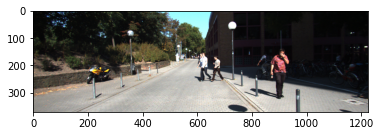

In [23]:
import glob
images_files = glob.glob('data/*.png')
idx = np.random.randint(0, len(images_files))

img_path = images_files[idx]
img = np.array(Image.open(img_path))
plt.imshow(img)
plt.show()

In [24]:
#TODO: Define the Pipeline by filling the Blanks
# def pipeline(img):
#     with torch.no_grad():
#         img_var = #Put the Image in PYTorch Variable
#         if torch.cuda.is_available():
#             img_var = # Send to GPU
#         segm, depth = # Call the HydraNet
#         segm = #PostProcess / Resize
#         depth = #PostProcess / Resize
#         segm = #Use the CMAP
#         depth = #Take the Absolute Value
#         return depth, segm

def pipeline(img):
    with torch.no_grad():
        img_var = Variable(torch.from_numpy(prepare_img(img).transpose(2, 0, 1)[None]), requires_grad=False).float()
        if torch.cuda.is_available():
            img_var = img_var.cuda()
        segm, depth = hydranet(img_var)
        segm = cv2.resize(segm[0, :NUM_CLASSES].cpu().data.numpy().transpose(1, 2, 0),
                        img.shape[:2][::-1],
                        interpolation=cv2.INTER_CUBIC)
        depth = cv2.resize(depth[0, 0].cpu().data.numpy(),
                        img.shape[:2][::-1],
                        interpolation=cv2.INTER_CUBIC)
        segm = CMAP[segm.argmax(axis=2)].astype(np.uint8)
        depth = np.abs(depth)
        return depth, segm

In [25]:
depth, segm = pipeline(img)

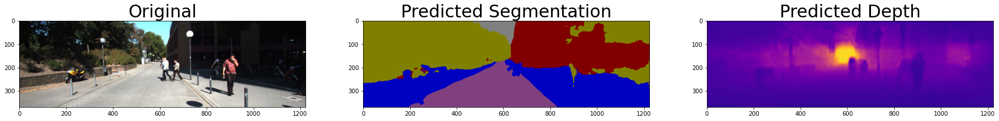

In [26]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,20))
ax1.imshow(img)
ax1.set_title('Original', fontsize=30)
ax2.imshow(segm)
ax2.set_title('Predicted Segmentation', fontsize=30)
ax3.imshow(depth, cmap="plasma", vmin=0, vmax=80)
ax3.set_title("Predicted Depth", fontsize=30)
plt.show()

## 3.4 — Run on a Video

In [27]:
print(img.shape)
print(depth.shape)
print(segm.shape)

(370, 1224, 3)
(370, 1224)
(370, 1224, 3)


(370, 1224, 3)


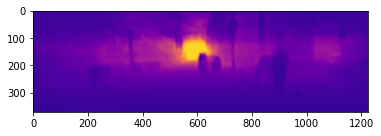

In [28]:
import matplotlib.cm as cm
import matplotlib.colors as co

def depth_to_rgb(depth):
    normalizer = co.Normalize(vmin=0, vmax=80)
    mapper = cm.ScalarMappable(norm=normalizer, cmap='plasma')
    colormapped_im = (mapper.to_rgba(depth)[:, :, :3] * 255).astype(np.uint8)
    return colormapped_im

depth_rgb = depth_to_rgb(depth)
print(depth_rgb.shape)
plt.imshow(depth_rgb)
plt.show()

(370, 1224, 3)
(370, 1224, 3)
(370, 1224, 3)


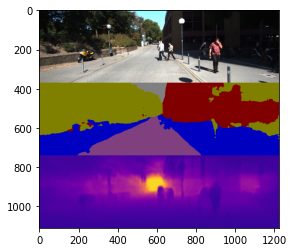

In [29]:
print(img.shape)
print(depth_rgb.shape)
print(segm.shape)
new_img = np.vstack((img, segm, depth_rgb))
plt.imshow(new_img)
plt.show()

In [31]:
video_files = sorted(glob.glob("data/*.png"))

# Build a HydraNet
hydranet = HydraNet()
hydranet.define_mobilenet()
hydranet.define_lightweight_refinenet()
# hydranet._initialize_weights()

# Set the Model to Eval on GPU
if torch.cuda.is_available():
    _ = hydranet.cuda()
_ = hydranet.eval()

# Load the Weights
ckpt = torch.load('ExpKITTI_joint.ckpt')
hydranet.load_state_dict(ckpt['state_dict'])

# Run the pipeline
result_video = []
for idx, img_path in enumerate(video_files):
    image = np.array(Image.open(img_path))
    h, w, _ = image.shape 
    depth, seg = pipeline(image)
    result_video.append(cv2.cvtColor(cv2.vconcat([image, seg, depth_to_rgb(depth)]), cv2.COLOR_BGR2RGB))

out = cv2.VideoWriter('output/out.mp4',cv2.VideoWriter_fourcc(*'MP4V'), 15, (w,3*h))

for i in range(len(result_video)):
    out.write(result_video[i])
out.release()

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


In [32]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('output/out.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=800 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [33]:
import shutil
shutil.make_archive('OUTPUT', 'zip', '/kaggle/working/output')

'/kaggle/working/OUTPUT.zip'

## 3D Segmentation

Did you ever wonder... How is segmentation used in self-driving cars? Like, **once you have the map, what do you do with it**?
<p>
Let's see something called 3D Segmentation — Fusing a Depth Map with a Segmentation Map!
<p>

In my course [MASTER STEREO VISION](https://courses.thinkautonomous.ai/stereo-vision), I teach how to do something called **3D Reconstruction** from a Depth Map and Calibration Parameters. <p>
In this course, we're going to see how to do it with Open3D, my go-to library for Point Clouds, and we'll see how to build 3D Segmentation Algorithms by fusing the Depth Map (3D) with the Segmentation Map.

In [ ]:
!pip install open3d==0.14.1

In [ ]:
import open3d as o3d

In [ ]:
o3d.__version__

### RGBD - Fuse the RGB Image and the Depth Map

The first thing we'll implement is to create an RGBD Image by fusing the RGB Image with the Depth Map. For that, we'll use [Open3D's Class RGBD Image](http://www.open3d.org/docs/release/python_api/open3d.geometry.RGBDImage.html) and the function create_from_color_and_depth(color, depth).<p>
It looks pretty straghtforward, we just need to make sure that the image are loaded as [Open3D Images](http://www.open3d.org/docs/release/python_api/open3d.geometry.Geometry.html?highlight=image#open3d.geometry.Geometry.Image).

In [ ]:
rgbd = #TODO: Call the Function

Next, we'll use the function create_from_rgbd_image to build a Point Cloud based on this. For that, we'll need the camera's intrinsic parameters. <p>
If you'd like to learn more about this, I invite you to take my course on [Stereo Vision](https://courses.thinkautonomous.ai/stereo-vision). In this course, I'm just going to give'em to you.

In [ ]:
o3d.camera.PinholeCameraIntrinsic??

In [ ]:
intrinsics = o3d.camera.PinholeCameraIntrinsic(width = 1242, height = 375, fx = 721., fy = 721., cx = 609., cy = 609.)

In [ ]:
point_cloud = #TODO: Create A Point Cloud
o3d.io.write_point_cloud("test.pcd", point_cloud)

### 3D Segmentation — Fuse the Segmentation Map with the Depth Map
From now on, the process is exactly the same. But instead of creating a Point Cloud from an RGBD Image with the Normal RGB Image, we'll do it with the Depth Map.

In [ ]:
rgbd = #TODO: Call the Function

In [ ]:
point_cloud = #TODO: Create A Point Cloud

In [ ]:
o3d.io.write_point_cloud("test_segm.pcd", point_cloud)